In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.tree import export_graphviz
from sklearn import tree
import graphviz
import dtreeviz
from sklearn import preprocessing
from dtreeviz.trees import *
from dtreeviz import trees
from xgboost import XGBClassifier
import xgboost as xgb
from xgboost import plot_importance
from xgboost import plot_tree
from matplotlib.pylab import rcParams
from bayes_opt import BayesianOptimization
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold, train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, mean_squared_error

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
TCGA = pd.read_csv('D:/TCGA_XGBoost/venv/TCGA_data/TCGA-Merge.csv')

In [ ]:
TCGA.rename({'days_to_death': 'years_to_death', 'days_to_birth': 'years_to_birth'}, axis=1, inplace=True)

TCGA['years_to_death'] = TCGA['years_to_death'].mul(0.002738)
TCGA['years_to_birth'] = TCGA['years_to_birth'].mul(-0.002738)

TCGA = TCGA.drop_duplicates(subset=['bcr_patient_barcode'])

In [ ]:
OHE_race = pd.get_dummies(TCGA['race_list'])
OHE_eth = pd.get_dummies(TCGA['ethnicity'])
OHE_neo = pd.get_dummies(TCGA['history_of_neoadjuvant_treatment'])
OHE_dx = pd.get_dummies(TCGA['other_dx'])

TCGA_data_OHE = pd.merge(left=OHE_race,right=TCGA,left_index=True,right_index=True)
TCGA_data_ETH = pd.merge(left=OHE_eth,right=TCGA_data_OHE,left_index=True,right_index=True)
TCGA_data_NEO = pd.merge(left=OHE_neo,right=TCGA_data_ETH,left_index=True,right_index=True)
TCGA_data_DX = pd.merge(left=OHE_dx,right=TCGA_data_NEO,left_index=True,right_index=True)

In [ ]:
TCGA_data_DX.rename(columns={'No_x': 'no history of malignancy', 'Yes_x': 'yes history of malignancy',
                             'Yes, History of Prior Malignancy': 'history of prior malignancy',
                             'Yes, History of Synchronous/Bilateral Malignancy':'synchrnous/bilateral malignancy',
                             'No_y': 'no radiation','Yes_y' : 'yes radiation',
                             'Yes, Radiation Prior to Resection':'radiation prior to resection',
                             'Yes, Pharmaceutical Treatment Prior to Resection': 'pharmaceutical treatment prior resection'},
                    inplace=True)

TCGA_data_A_encoded = TCGA_data_DX.drop(['race_list','other_dx','ethnicity','history_of_neoadjuvant_treatment'],axis=1)

In [ ]:
TCGA_data_A_encoded['gender'] = TCGA_data_A_encoded['gender'].map({'MALE': 0,'FEMALE': 1})
TCGA_data_A_encoded['has_radiations_information'] = TCGA_data_A_encoded['has_radiations_information'].map({'NO': 0,'YES': 1})
TCGA_data_A_encoded['vital_status'] = TCGA_data_A_encoded['vital_status'].map({'Alive': 0,'Dead': 1})
TCGA_data_A_encoded['has_drugs_information'] = TCGA_data_A_encoded['has_drugs_information'].map({'NO': 0,'YES': 1})

In [ ]:
TCGA_data_A_encoded = TCGA_ready.drop(['race_list','other_dx','ethnicity','history_of_neoadjuvant_treatment'],axis=1)

In [ ]:
TCGA_ready = TCGA_data_A_encoded.sample(frac=1).reset_index(drop=True)

In [ ]:
TCGA_ready = TCGA_ready.drop(['bcr_patient_barcode'],axis=1)

In [ ]:
TCGA_ready = TCGA_ready.drop(['days_to_death','days_to_birth'],axis=1)

In [ ]:
TCGA_ready = TCGA_ready.drop(['race_list','other_dx','ethnicity','history_of_neoadjuvant_treatment'],axis=1)

In [ ]:
TCGA_ready['gender'] = TCGA_ready['gender'].map({'MALE': 0,'FEMALE': 1})
TCGA_ready['has_radiations_information'] = TCGA_ready['has_radiations_information'].map({'NO': 0,'YES': 1})
TCGA_ready['vital_status'] = TCGA_ready['vital_status'].map({'Alive': 0,'Dead': 1})
TCGA_ready['has_drugs_information'] = TCGA_ready['has_drugs_information'].map({'NO': 0,'YES': 1})

In [6]:
TCGA_ready['CFH'] = TCGA_ready['CFH'].replace('`',0)
TCGA_ready['ANKIB1'] = TCGA_ready['ANKIB1'].replace('`',0)

In [7]:
Y=pd.DataFrame(TCGA_ready,columns=['project'])
X=TCGA_ready.drop(['project'],axis=1)

In [8]:
(X_train,X_test,Y_train,Y_test) = train_test_split(X,Y, test_size=.20)

In [9]:
X_train=X_train.astype('float32')
X_test=X_test.astype('float32')

In [10]:
label_encoder_train = preprocessing.LabelEncoder()
label_encoder_train.fit(Y_train)
Y_train = label_encoder_train.transform(Y_train)

label_encoder_test = preprocessing.LabelEncoder()
label_encoder_test.fit(Y_test)
Y_test = label_encoder_test.transform(Y_test)

In [11]:
model=XGBClassifier()
model.fit(X_train,Y_train,eval_metric=["merror","mlogloss"],eval_set=[(X_train,Y_train),(X_test,Y_test)],verbose = True,early_stopping_rounds=10)
predictions=model.predict(X_test)
predictions = [round(value) for value in predictions]
accuracy=accuracy_score(Y_test,predictions)
print("Accuracy: %.2f%%" % (accuracy*100))

[0]	validation_0-merror:0.04046	validation_0-mlogloss:0.60759	validation_1-merror:0.10980	validation_1-mlogloss:0.83539
[1]	validation_0-merror:0.02280	validation_0-mlogloss:0.43335	validation_1-merror:0.09118	validation_1-mlogloss:0.69829
[2]	validation_0-merror:0.01483	validation_0-mlogloss:0.32002	validation_1-merror:0.07696	validation_1-mlogloss:0.60241
[3]	validation_0-merror:0.00968	validation_0-mlogloss:0.24012	validation_1-merror:0.07402	validation_1-mlogloss:0.52767
[4]	validation_0-merror:0.00772	validation_0-mlogloss:0.18227	validation_1-merror:0.07059	validation_1-mlogloss:0.46867
[5]	validation_0-merror:0.00515	validation_0-mlogloss:0.13886	validation_1-merror:0.06912	validation_1-mlogloss:0.42079
[6]	validation_0-merror:0.00294	validation_0-mlogloss:0.10638	validation_1-merror:0.06667	validation_1-mlogloss:0.38152
[7]	validation_0-merror:0.00159	validation_0-mlogloss:0.08194	validation_1-merror:0.06373	validation_1-mlogloss:0.34821
[8]	validation_0-merror:0.00086	validati

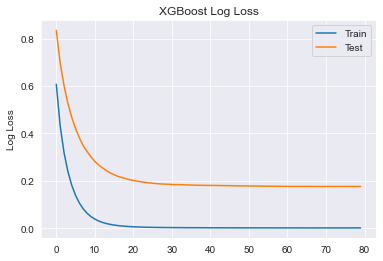

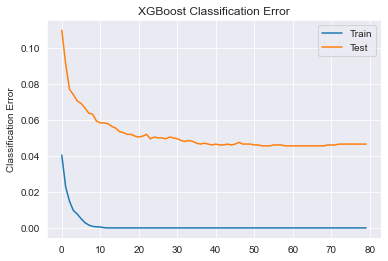

In [12]:
results = model.evals_result()
epochs = len(results['validation_0']['merror'])
x_axis = range(0, epochs)

# plot log loss
fig, ax = pyplot.subplots()
ax.plot(x_axis, results['validation_0']['mlogloss'], label='Train')
ax.plot(x_axis, results['validation_1']['mlogloss'], label='Test')
ax.legend()
pyplot.ylabel('Log Loss')
pyplot.title('XGBoost Log Loss')
pyplot.show()
# plot classification error
fig, ax = pyplot.subplots()
ax.plot(x_axis, results['validation_0']['merror'], label='Train')
ax.plot(x_axis, results['validation_1']['merror'], label='Test')
ax.legend()
pyplot.ylabel('Classification Error')
pyplot.title('XGBoost Classification Error')
pyplot.show()

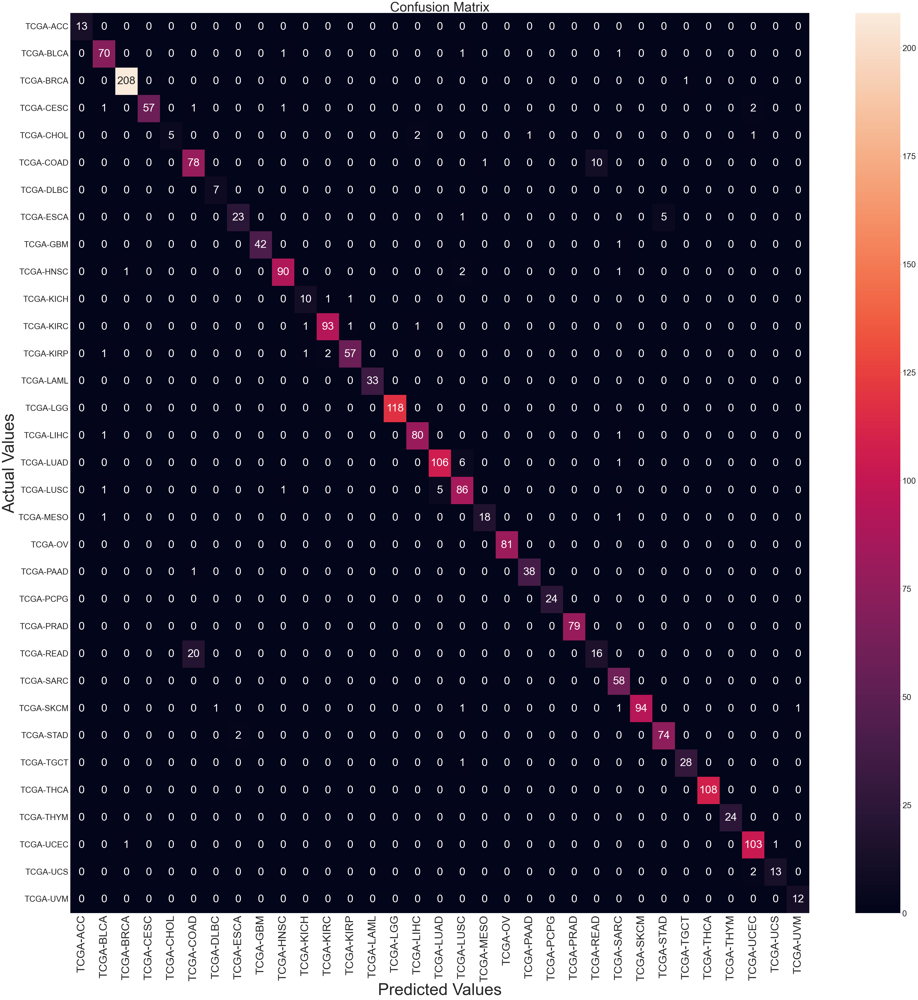

In [17]:
#create a confusion matrix with seaborn
cf_matrix = confusion_matrix(Y_test,predictions)
cm_df = pd.DataFrame(cf_matrix,index=list(label_encoder_train.classes_),columns=list(label_encoder_train.classes_))

plt.figure(figsize=(60,60))
sns.heatmap(cm_df, annot=True,fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual Values')
plt.xlabel('Predicted Values')
plt.show()

In [18]:
rcParams['figure.figsize'] = 80,40
rcParams['font.size'] = 40
rcParams['axes.labelsize'] = 60
rcParams['xtick.labelsize'] = 40
rcParams['ytick.labelsize'] = 30
rcParams['axes.axisbelow'] = True

<AxesSubplot:title={'center':'Gain'}, xlabel='F score', ylabel='Features'>

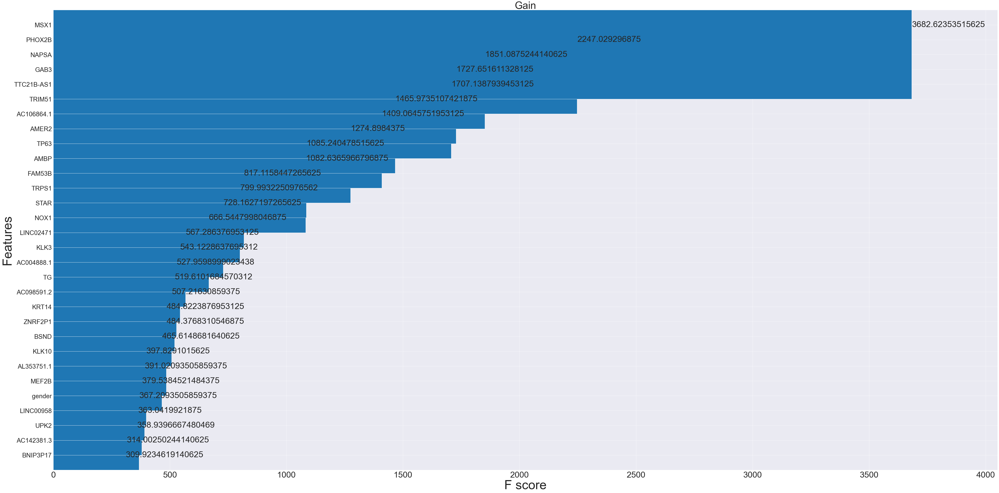

In [19]:
plot_importance(model,height=10,max_num_features=30,importance_type='gain',title='Gain')

<AxesSubplot:title={'center':'weight'}, xlabel='F score', ylabel='Features'>

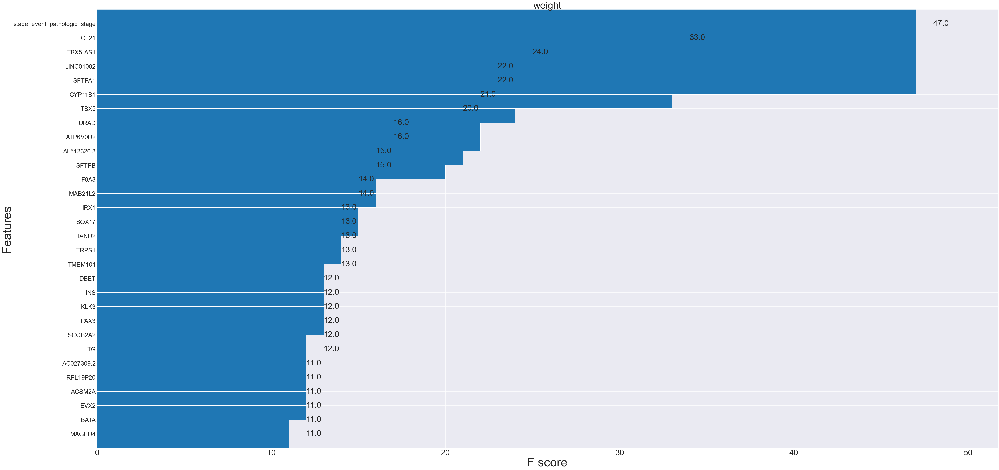

In [20]:
plot_importance(model,height=10,max_num_features=30,importance_type='weight',title='weight')

<AxesSubplot:title={'center':'cover'}, xlabel='F score', ylabel='Features'>

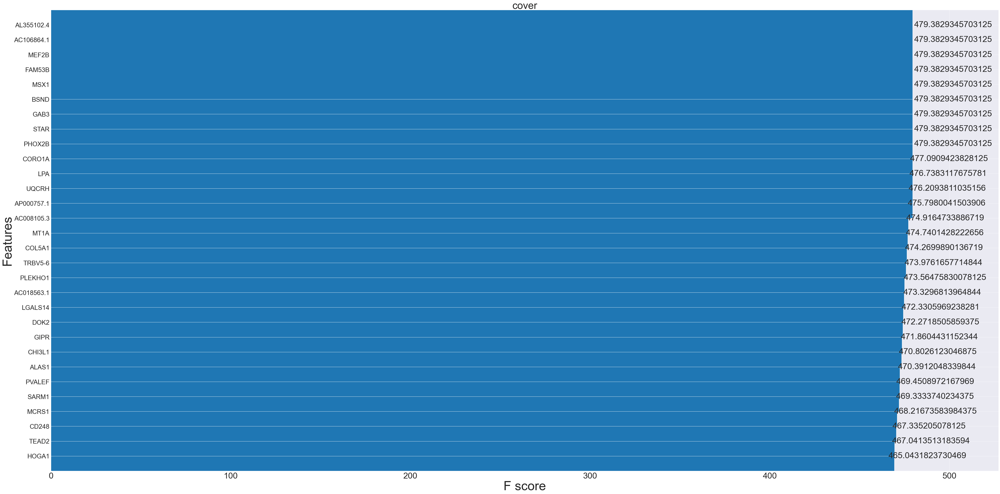

In [21]:
plot_importance(model,height=10,max_num_features=30,importance_type='cover',title='cover')

In [29]:
trees.dtreeviz(model, X_train,Y_train,  target_name= 'project', feature_names= list(X_train.columns), class_names= list(label_encoder_train.classes_), tree_index=1)